# Spatial Transcriptomics Hands-On (PHCCO Summer Training 2025)

In [1]:
import os
import pandas as pd
import scanpy as sc
import gseapy as gp
import squidpy as sq
import seaborn as sns
import matplotlib.pyplot as plt
sc.settings.figdir = './figures'
os.makedirs('./figures', exist_ok=True)
os.makedirs('./Output', exist_ok=True)
plt.rcParams['svg.hashsalt'] = ''
sns.set_context('talk')

/home/bv/Documents/IISc/Internship/2025/.venv/lib64/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/bv/Documents/IISc/Internship/2025/.venv/lib64/python3.11/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/home/bv/Documents/IISc/Internship/2025/.venv/lib64/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.


## The Data structure
We will be using the [Breast Cancer Visium](https://www.10xgenomics.com/datasets/gene-and-protein-expression-library-of-human-breast-cancer-cytassist-ffpe-2-standard) dataset from 10x genomics. 

First take note of the directory structure. Usually [spaceranger](https://www.10xgenomics.com/support/software/space-ranger/latest/analysis/outputs/output-overview) gives the output in a certain format. We need a minimum of the [`filtered_feature_bc_matrix.h5`](https://cf.10xgenomics.com/samples/spatial-exp/2.1.0/CytAssist_FFPE_Protein_Expression_Human_Breast_Cancer/CytAssist_FFPE_Protein_Expression_Human_Breast_Cancer_filtered_feature_bc_matrix.h5) and a [`spatial`](https://cf.10xgenomics.com/samples/spatial-exp/2.1.0/CytAssist_FFPE_Protein_Expression_Human_Breast_Cancer/CytAssist_FFPE_Protein_Expression_Human_Breast_Cancer_spatial.tar.gz) directory containing `tissue_hires_image.png`, `scalefactors_json.json`, and `tissue_positions_list.csv` for loading into squidpy. There are ways to load data not in this format but it is recommended to rearrange the data in this format if possible.


In [2]:
DS = './Data/CytAssist_FFPE_Protein_Expression_Human_Breast_Cancer'

In [3]:
adata = sq.read.visium(DS)

/home/bv/Documents/IISc/Internship/2025/.venv/lib64/python3.11/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/bv/Documents/IISc/Internship/2025/.venv/lib64/python3.11/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
adata

AnnData object with n_obs × n_vars = 4169 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'isotype_control', 'normalized', 'pattern', 'read', 'secondary_name', 'sequence'
    uns: 'spatial'
    obsm: 'spatial'

Let us take a look at the data. It is pretty much the same as the scanpy object (AnnData) with adata.obs for the cell annotations and adata.var for the gene annotations and adata.X being the gene expression matrix. Note that we have raw counts.

In [5]:
adata.obs

,in_tissue,array_row,array_col
AACACTTGGCAAGGAA-1,1,47,71
AACAGGATTCATAGTT-1,1,49,43
AACAGGCCAACGATTA-1,1,71,127
AACAGGTTATTGCACC-1,1,28,86
AACAGGTTCACCGAAG-1,1,51,41
...,...,...,...
TGTTGGAACGAGGTCA-1,1,28,72
TGTTGGAAGCTCGGTA-1,1,1,95
TGTTGGATGGACTTCT-1,1,13,53
TGTTGGCCAGACCTAC-1,1,49,47


In [6]:
adata.var

,gene_ids,feature_types,genome,isotype_control,normalized,pattern,read,secondary_name,sequence
SAMD11,ENSG00000187634,Gene Expression,GRCh38,,FALSE,,,,
NOC2L,ENSG00000188976,Gene Expression,GRCh38,,FALSE,,,,
KLHL17,ENSG00000187961,Gene Expression,GRCh38,,FALSE,,,,
PLEKHN1,ENSG00000187583,Gene Expression,GRCh38,,FALSE,,,,
PERM1,ENSG00000187642,Gene Expression,GRCh38,,FALSE,,,,
...,...,...,...,...,...,...,...,...,...
MT-ND4L,ENSG00000212907,Gene Expression,GRCh38,,FALSE,,,,
MT-ND4,ENSG00000198886,Gene Expression,GRCh38,,FALSE,,,,
MT-ND5,ENSG00000198786,Gene Expression,GRCh38,,FALSE,,,,
MT-ND6,ENSG00000198695,Gene Expression,GRCh38,,FALSE,,,,


In [7]:
adata.X.todense()

matrix([[ 0.,  0.,  0., ...,  1.,  1.,  3.],
        [ 0.,  0.,  0., ...,  6., 23., 42.],
        [ 0.,  0.,  0., ...,  3., 13., 20.],
        ...,
        [ 0.,  0.,  0., ...,  1.,  5.,  1.],
        [ 0.,  0.,  0., ...,  2., 10., 30.],
        [ 0.,  0.,  0., ...,  0.,  4.,  0.]],
       shape=(4169, 18085), dtype=float32)

But in addition to that we also have some spatial specific data. We got the coordinates of spots, images and some metadata such as scaling factors.

In [8]:
adata.obsm['spatial']

array([[10571,  8966],
       [ 6251,  8452],
       [19169,  2482],
       ...,
       [ 7844, 18100],
       [ 6868,  8449],
       [19218, 11602]], shape=(4169, 2))

In [9]:
adata.uns['spatial']

{'CytAssist_FFPE_Protein_Expression_Human_Breast_Cancer': {'metadata': {'chemistry_description': 'Visium V4 Slide',
   'software_version': 'spaceranger-2.1.0'},
  'images': {'hires': array([[[  0,   0,   1],
           [  0,   0,   1],
           [  0,   0,   1],
           ...,
           [ 12,  34,  84],
           [ 12,  33,  85],
           [ 13,  33,  84]],
   
          [[  0,   0,   1],
           [  0,   0,   1],
           [  0,   0,   1],
           ...,
           [ 13,  44, 102],
           [ 13,  44, 103],
           [ 13,  43, 103]],
   
          [[  0,   0,   1],
           [  0,   0,   1],
           [  0,   0,   1],
           ...,
           [ 16,  42, 111],
           [ 16,  41, 109],
           [ 16,  41, 110]],
   
          ...,
   
          [[  0,   0,   0],
           [  0,   0,   0],
           [  0,   0,   0],
           ...,
           [112,  42, 161],
           [116,  38, 151],
           [114,  38, 147]],
   
          [[  0,   0,   0],
           [  0, 

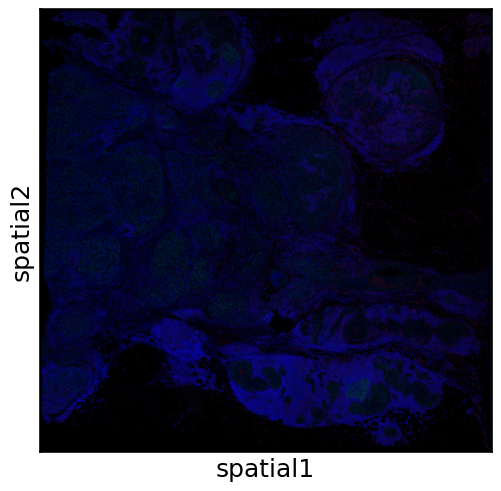

In [10]:
sq.pl.spatial_scatter(adata)

The data provided has information about the immunofluorescence channel intensities also. Let us add that to our data structure.

In [11]:
metdat = pd.read_csv(f'{DS}/spatial/barcode_fluorescence_intensity.csv', index_col=0)

In [12]:
metdat

,in_tissue,PCNA_mean,PCNA_stdev,Vimentin_mean,Vimentin_stdev,DAPI_mean,DAPI_stdev
barcode,,,,,,,
GTCACTTCCTTCTAGA-1,0,NaN,NaN,NaN,NaN,NaN,NaN
CACGGTCTCCTTACGA-1,0,67.219885,1.423454,21.254302,1.673764,120.556405,2.212033
ATAGCTGCGGATAAGA-1,0,67.011893,1.718510,20.887017,1.321890,118.345887,2.911017
GTCAGTATGTCCGGCG-1,0,69.459861,6.043337,23.920714,13.680542,120.760159,17.406467
ATGTACCAGTTACTCG-1,0,69.246779,3.927685,24.792864,8.670131,124.339941,24.810369
...,...,...,...,...,...,...,...
TCCGACCGCAAGTCCT-1,1,691.313181,244.441219,1688.077304,1029.115079,4192.563925,2061.729694
GTCAGTTGGAACCACG-1,1,610.122894,278.322155,1688.529237,1240.421164,3243.703667,2161.242775
GTCGAGACCGTCCGTT-1,1,767.319128,173.337784,1794.427156,1154.989696,3942.323092,1490.823843


In [13]:
metdat.drop('in_tissue', axis=1, inplace=True)

In [14]:
adata.obs = adata.obs.join(metdat)

In [15]:
adata.obs

,in_tissue,array_row,array_col,PCNA_mean,PCNA_stdev,Vimentin_mean,Vimentin_stdev,DAPI_mean,DAPI_stdev
AACACTTGGCAAGGAA-1,1,47,71,770.239841,340.581162,951.338949,649.268325,4736.257681,2521.198272
AACAGGATTCATAGTT-1,1,49,43,1958.809713,1652.943868,220.823588,230.981966,3670.355798,1915.499774
AACAGGCCAACGATTA-1,1,71,127,771.331021,358.007302,2500.386521,2485.575518,3778.959366,2457.736514
AACAGGTTATTGCACC-1,1,28,86,1600.042616,915.088789,1365.852329,1063.754841,5814.954410,2651.670094
AACAGGTTCACCGAAG-1,1,51,41,2277.292369,1245.617486,206.964321,552.494590,4418.690783,1543.086727
...,...,...,...,...,...,...,...,...,...
TGTTGGAACGAGGTCA-1,1,28,72,694.507433,266.214576,700.789891,517.851039,3746.705649,2536.095991
TGTTGGAAGCTCGGTA-1,1,1,95,1135.185332,727.403462,1263.672944,1063.149691,6618.202180,4868.589477
TGTTGGATGGACTTCT-1,1,13,53,742.178394,267.177954,1227.261645,622.418521,9421.697721,4015.426789
TGTTGGCCAGACCTAC-1,1,49,47,1439.021804,706.775918,531.841427,581.904829,5801.687810,2569.874035


## Preprocessing
We can now start with the pre-processing.

First let us look at the data quality.

In [16]:
def QC_metrics(adata):
    # Make unique if duplicates
    adata.var_names_make_unique()
    # mitochondrial genes, "MT-" for human, "Mt-" for mouse
    adata.var["mt"] = adata.var_names.str.startswith("MT-")
    # ribosomal genes
    adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
    # hemoglobin genes
    adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")
    sc.pp.calculate_qc_metrics(
        adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
    )
    varibs = ["n_genes_by_counts", "total_counts", "pct_counts_mt"]
    sc.pl.violin(
        adata,
        varibs,
        jitter=0.4,
        multi_panel=True,
    )

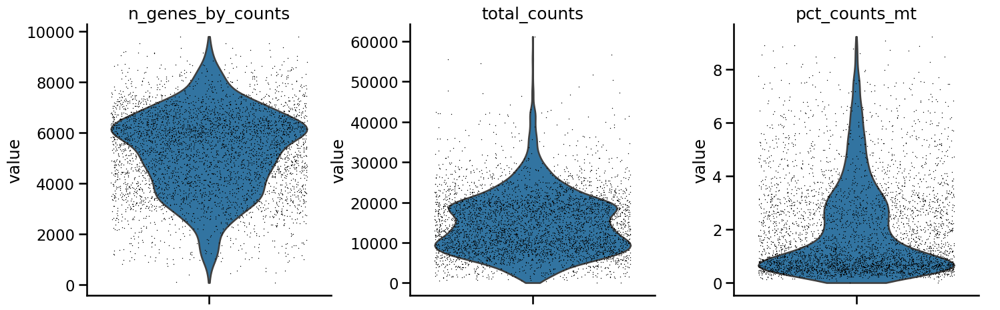

In [17]:
QC_metrics(adata)

Then perform log-normalization.

In [18]:
def normalize(adata, target_sum=10000):
    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_total(adata,target_sum=target_sum)
    adata.layers["norm"] = adata.X.copy()
    sc.pp.log1p(adata)

In [19]:
normalize(adata)

And then we can do UMAP dimensional reduction and leiden clustering. These steps are the same as single cell.
We'll also plot these clusters on our spatial image. Remember that these clusters depend on the parameters used, do no treat them as the ground truth.

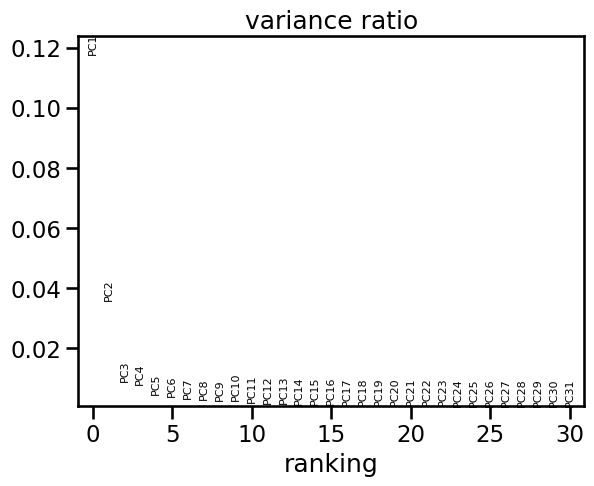

In [20]:
sc.pp.pca(adata)
sc.pl.pca_variance_ratio(adata)

In [21]:
def umap_cluster(adata, res=None, n_pcs=None, img_res_key='hires'):
    sc.pp.neighbors(adata, 
                    n_neighbors=30, 
                    n_pcs=n_pcs
                    )
    sc.tl.umap(adata, 
               min_dist=0.3, 
               spread=1.0
               )
    if 'leiden_colors' in adata.uns_keys():
        adata.uns.pop('leiden_colors')
    sc.tl.leiden(adata, flavor='igraph', n_iterations=2, resolution=res)
    sc.pl.umap(adata, color='leiden', save='_leiden.png')
    sq.pl.spatial_scatter(adata, color='leiden', save='spatial_leiden.png', img_res_key=img_res_key)

/home/bv/Documents/IISc/Internship/2025/.venv/lib64/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


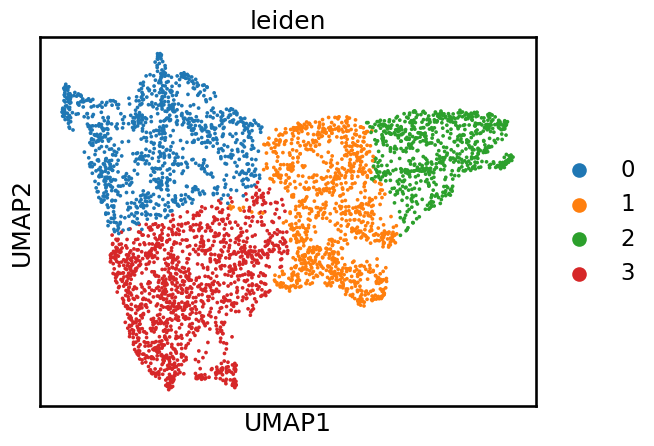

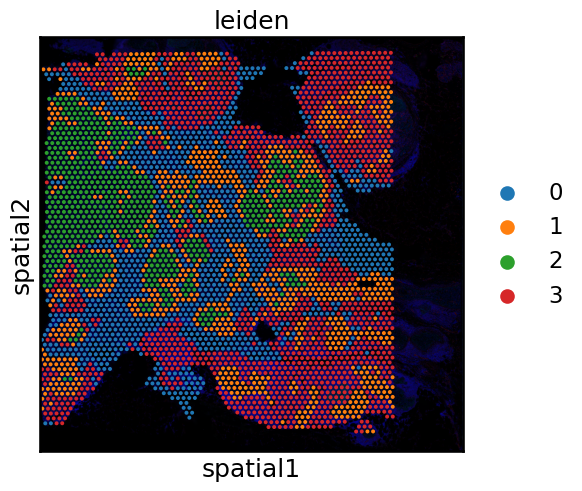

In [22]:
umap_cluster(adata,res=0.2, n_pcs=5)

## Visualization

Let us visualize the total_counts per spot and compare it with the DAPI (Nuclei) and PCNA (Proliferating cells) intensities.

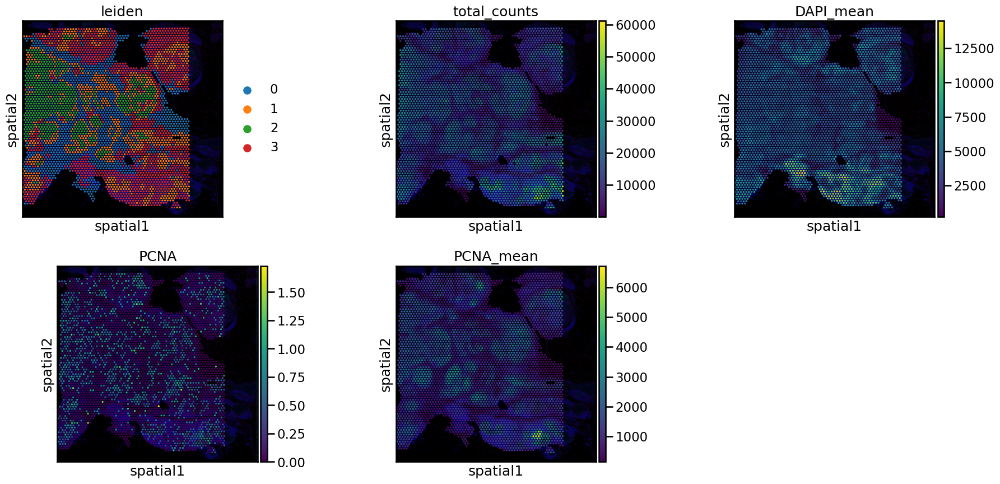

In [23]:
sq.pl.spatial_scatter(adata,color=['leiden','total_counts', 'DAPI_mean', 'PCNA', 'PCNA_mean'],ncols=3, save='count_markers.png')

Now let us look at try to determine the tumour regions and subtypes
- ER+ve Basal markers: ERS1 (Estrogen receptor), GATA3, PGR and FOXA1 
- Epithelial markers: CDH1 (E-Cadherin), CD24
- Mesenchymal markers: CD44, VIM

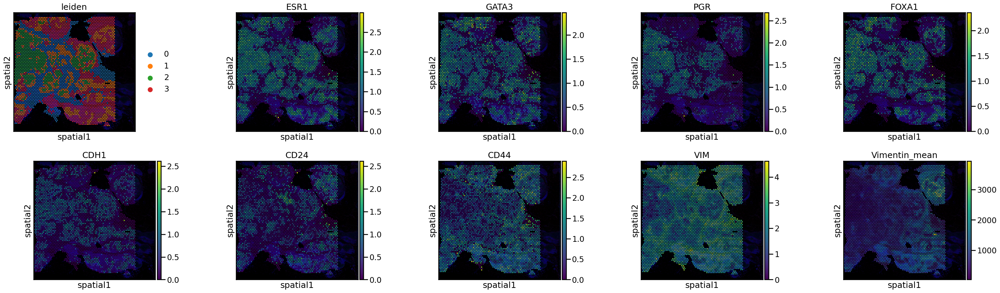

In [24]:
subtype_gene = ['ESR1', 'GATA3', 'PGR', 'FOXA1', 'CDH1', 'CD24', 'CD44','VIM']
sq.pl.spatial_scatter(adata, color=['leiden'] + subtype_gene + ['Vimentin_mean'], ncols=5, save='tumour_markers.png')

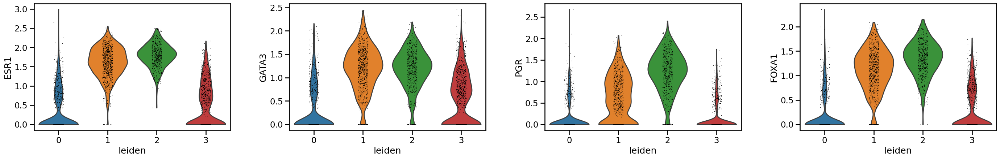

In [25]:
sc.pl.violin(adata, subtype_gene[:4], groupby='leiden', save='_tumour_markers1.png')

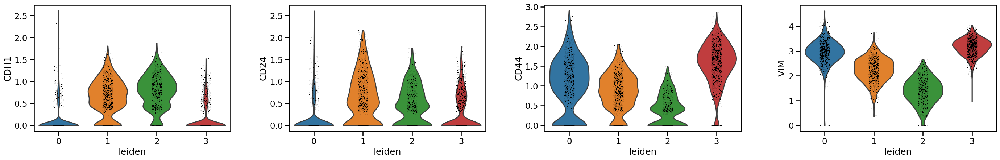

In [26]:
sc.pl.violin(adata, subtype_gene[4:], groupby='leiden', save='_tumour_markers2.png')

From these it looks like clusters 1 and 2 are tumour regions (Note that these labels could different when you run). Among them, cluster 2 is the core and cluster 1 is towards the periphery. 

These are mostly epithelial in nature as expected but the peripheral regions also show some mesenchymal charecteristics. However, we cannot differentiate if this is due to cancer cells undergoing EMT or due to prevalance of (normal) mesenchymal celltypes.

Now let us look at some immune cell markers.
- CD3D: Generic T cell
- CD4: T-helper cells
- CD8A: Cytotoxic T cells
- CD68: Macrophage
- FN1, COL1A2: Fibroblasts
- PECAM1: Endothelial cells
- NKG7: Natural Killer (NK) cells 
- CD79A: B cells

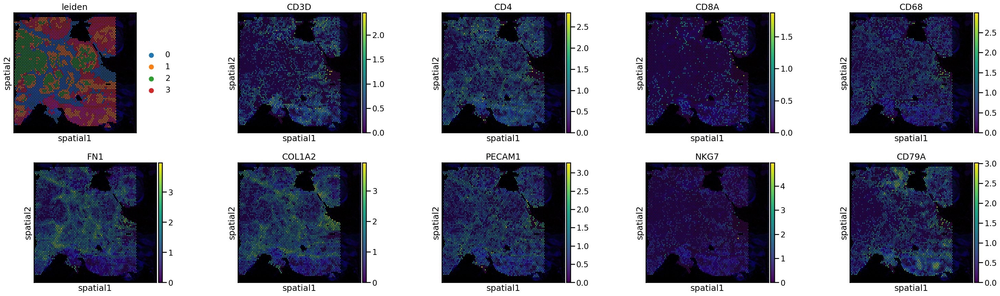

In [27]:
immune_gene = ['CD3D', 'CD4','CD8A', 'CD68', 'FN1', 'COL1A2', 'PECAM1', 'NKG7', 'CD79A']
sq.pl.spatial_scatter(adata, color=['leiden'] + immune_gene, ncols=5, save='immune_markers.png')

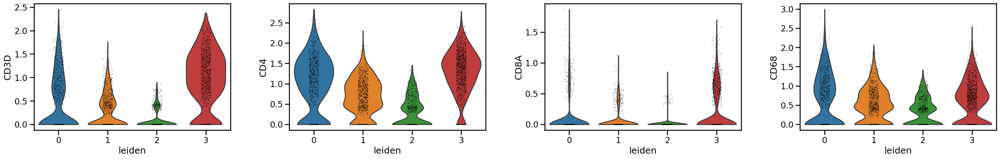

In [28]:
sc.pl.violin(adata, immune_gene[:4], groupby='leiden', save='_immune_markers1.png')

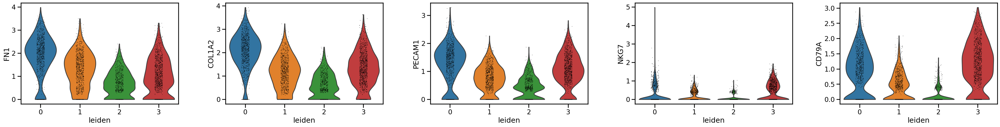

In [29]:
sc.pl.violin(adata, immune_gene[4:], groupby='leiden', save='_immune_markers2.png')

Cluster 0 tends to be enriched for fibroblasts and stromal cells whereas Cluster 3 is enriched for immune cells. 

## Marker Genes

We can obtain genes that are highly expressed specific to the different clusters.

In [30]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='logreg')

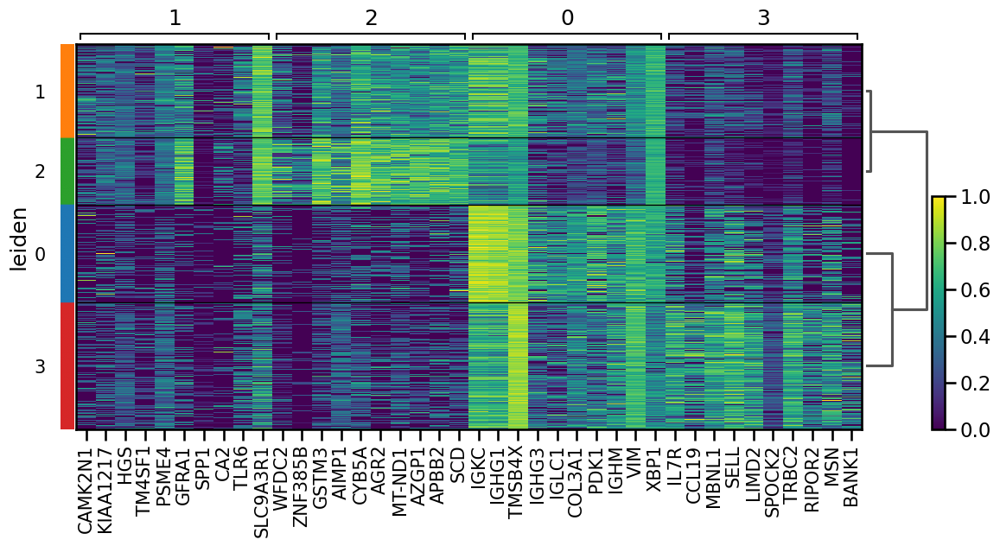

In [31]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=10, standard_scale='var', save='DEG.png')

We can put these genes through Gene Ontology to get an idea of what the regions could be.

In [32]:
top_genes = pd.DataFrame({
    group: adata.uns['rank_genes_groups']['names'][group][:100]
    for group in adata.uns['rank_genes_groups']['names'].dtype.names
})
top_genes.to_csv('Output/top100_genes.csv', index=False)

## Spatial statistics

100%|██████████| 1000/1000 [00:00<00:00, 4749.20/s]


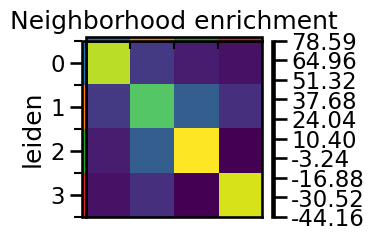

In [33]:
sq.gr.spatial_neighbors(adata)
sq.gr.nhood_enrichment(adata, cluster_key="leiden")
sq.pl.nhood_enrichment(adata, cluster_key="leiden",save='nhood.png')

This says that cluster 2 tend to be together. Cluster 1 tend to be neighbour with cluster 2 followed by 0 and 1. This makes sense that they are the core vs periphery.

100%|██████████| 1/1 [00:05<00:00,  5.87s/]


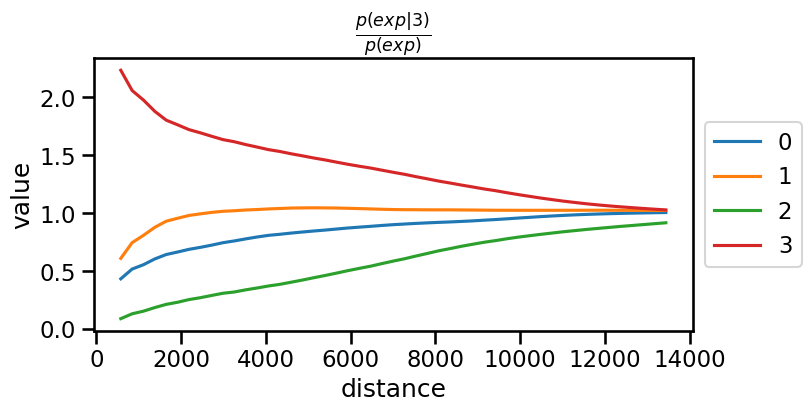

In [34]:
sq.gr.co_occurrence(adata, cluster_key="leiden")
sq.pl.co_occurrence(
    adata,
    cluster_key="leiden",
    clusters="3",
    figsize=(8, 4),
    save='co_occur.png'
)

Co-occurance isn't really helpful due to the lower resolution of our region clusters.

However, Moran's I is more useful as it helps us identify spatially variable genes.

In [35]:
sc.pp.highly_variable_genes(adata)
sq.gr.spatial_neighbors(adata)
genes = adata[:, adata.var.highly_variable].var_names.values[:1000]
sq.gr.spatial_autocorr(
    adata,
    mode="moran",
    genes=genes,
    n_perms=100,
    n_jobs=1, #Multi-threading has issues with dask
)

100%|██████████| 100/100 [00:06<00:00, 16.22/s]


In [36]:
adata.uns["moranI"].head(10)

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
GSTM3,0.729750,0.0,0.000084,0.0,0.009901,0.000152,0.0,0.0,0.011703
LTF,0.727404,0.0,0.000084,0.0,0.009901,0.000174,0.0,0.0,0.011703
DSP,0.718570,0.0,0.000084,0.0,0.009901,0.000141,0.0,0.0,0.011703
APOD,0.708744,0.0,0.000084,0.0,0.009901,0.000166,0.0,0.0,0.011703
TTC39A,0.697545,0.0,0.000084,0.0,0.009901,0.000146,0.0,0.0,0.011703
CRABP2,0.697260,0.0,0.000084,0.0,0.009901,0.000150,0.0,0.0,0.011703
ZNF385B,0.687860,0.0,0.000084,0.0,0.009901,0.000182,0.0,0.0,0.011703
BMPR1B,0.687010,0.0,0.000084,0.0,0.009901,0.000167,0.0,0.0,0.011703
CPB1,0.686329,0.0,0.000084,0.0,0.009901,0.000141,0.0,0.0,0.011703
BRINP3,0.685416,0.0,0.000084,0.0,0.009901,0.000136,0.0,0.0,0.011703


In [37]:
adata.uns["moranI"].to_csv('./Output/MoransI.csv')

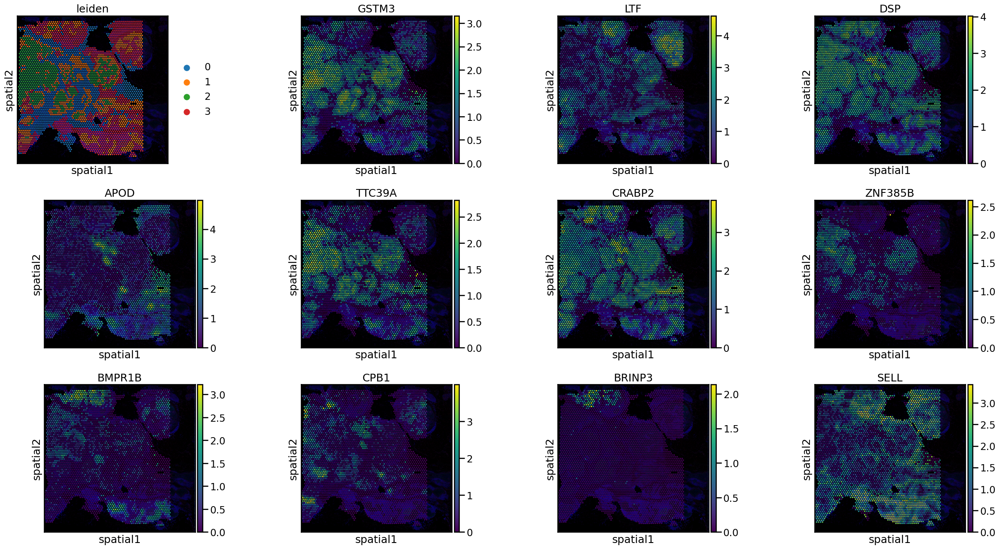

In [38]:
sq.pl.spatial_scatter(adata, color=['leiden']+ adata.uns["moranI"].head(11).index.tolist(), save='spatially_variable.png')

In [39]:
sq.gr.spatial_autocorr(
    adata,
    mode="moran",
    genes=adata.obs.columns[adata.obs.columns.str.endswith('_mean')].to_list(),
    attr='obs',
    n_perms=100,
    n_jobs=1, #Multi-threading has issues with dask
)

  0%|          | 0/100 [00:00<?, ?/s]

100%|██████████| 100/100 [00:00<00:00, 393.44/s]


In [40]:
adata.uns["moranI"].to_csv('./Output/IF_MoransI.csv')